<center><h1>Vaidya_Anushka_HW6</h1></center>

Name: Anushka Vaidya
<br>
Github Username:Anushka-Vaidya 
<br>
USC ID: 1450633814

## 1. Tree-Based Methods

Import packages

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn import svm
import warnings
warnings.filterwarnings('ignore')

from imblearn.pipeline import Pipeline 
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, roc_auc_score,roc_curve, auc, accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE

### (a) Download the APS Failure data

In [2]:
training_file='../data/aps_failure_training_set.csv'
testing_file='../data/aps_failure_test_set.csv'
description_file='../data/aps_failure_description.txt'

In [3]:
training= pd.read_csv(training_file, skiprows=20, na_values='na')
testing= pd.read_csv(testing_file, skiprows=20, na_values='na')
print("Training Data Shape: ", training.shape)
print("Testing Data Shape: ", testing.shape)

Training Data Shape:  (60000, 171)
Testing Data Shape:  (16000, 171)


In [4]:
training

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,NaN,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,neg,33058,NaN,0.000000e+00,NaN,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,neg,41040,NaN,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,neg,12,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,neg,60874,NaN,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,NaN,6.640000e+02,186.0,0.0,0.0,0.0,0.0,0.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,neg,2286,NaN,2.130707e+09,224.0,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,neg,112,0.0,2.130706e+09,18.0,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,neg,80292,NaN,2.130706e+09,494.0,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


In [5]:
testing

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0.0,2.000000e+01,12.0,0.0,0.0,0.0,0.0,0.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
1,neg,82,0.0,6.800000e+01,40.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
2,neg,66002,2.0,2.120000e+02,112.0,0.0,0.0,0.0,0.0,0.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
3,neg,59816,NaN,1.010000e+03,936.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
4,neg,1814,NaN,1.560000e+02,140.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,NaN,2.130706e+09,892.0,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
15996,neg,18,0.0,5.200000e+01,46.0,8.0,26.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
15997,neg,79636,NaN,1.670000e+03,1518.0,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
15998,neg,110,NaN,3.600000e+01,32.0,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


### (b) Data Preparation

#### (i) Research what types of techniques are usually used

Types of commonly used techniques to deal with missind data are:

1. Mean Imputation
2. Median Imputation
3. Multivariate Imputation by Chained equations
4. K nearest Neighbors
5. Maximum or minimum value
6. Most frequent value
7. Average value
8. Hot/Cold deck imputation
9. Arbitrary value data imputation
10. Scikitlearn's SimpleImputer/iterrative data imputation

Here I used mean imputation method.

In [6]:
#data imputation
train_imp = training.fillna(training.mean().round(2))
test_imp= testing.fillna(testing.mean().round(2))

#train and test dataset splitting
train_imp['class'] = train_imp['class'].replace({'pos': 1, 'neg': 0})
test_imp['class'] = test_imp['class'].replace({'pos': 1, 'neg': 0})
train_x=train_imp.iloc[:, 1:]
train_y=train_imp.iloc[:, [0]]
test_x=test_imp.iloc[:, 1:]
test_y=test_imp.iloc[:, [0]]

In [7]:
train_x

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698,0.71,2.130706e+09,280.00,0.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,33058,0.71,0.000000e+00,190620.64,0.0,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,41040,0.71,2.280000e+02,100.00,0.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,12,0.00,7.000000e+01,66.00,0.0,10.0,0.0,0.0,0.0,318.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,60874,0.71,1.368000e+03,458.00,0.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,153002,0.71,6.640000e+02,186.00,0.0,0.0,0.0,0.0,0.0,2564.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,2286,0.71,2.130707e+09,224.00,0.0,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,112,0.00,2.130706e+09,18.00,0.0,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,80292,0.71,2.130706e+09,494.00,0.0,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


In [8]:
train_y

,class
0,0
1,0
2,0
3,0
4,0
...,...
59995,0
59996,0
59997,0
59998,0


#### (ii) Calculate the coefficient of variation

In [9]:
col= train_x.columns.tolist()
stats_df= pd.DataFrame()

for column in col:
    std= train_x[column].std()
    mean= train_x[column].mean()
    cv=std/mean
    stats_df[column]= [cv]
    
cv=stats_df.T
cv= cv.rename(columns={0:'CV'})
cv

,CV
aa_000,2.450938
ab_000,2.336466
ac_000,2.169767
ad_000,183.847620
ae_000,23.190813
...,...
ee_007,4.962483
ee_008,3.222010
ee_009,5.626979
ef_000,47.138632


#### (iii) Plot a correlation matrix

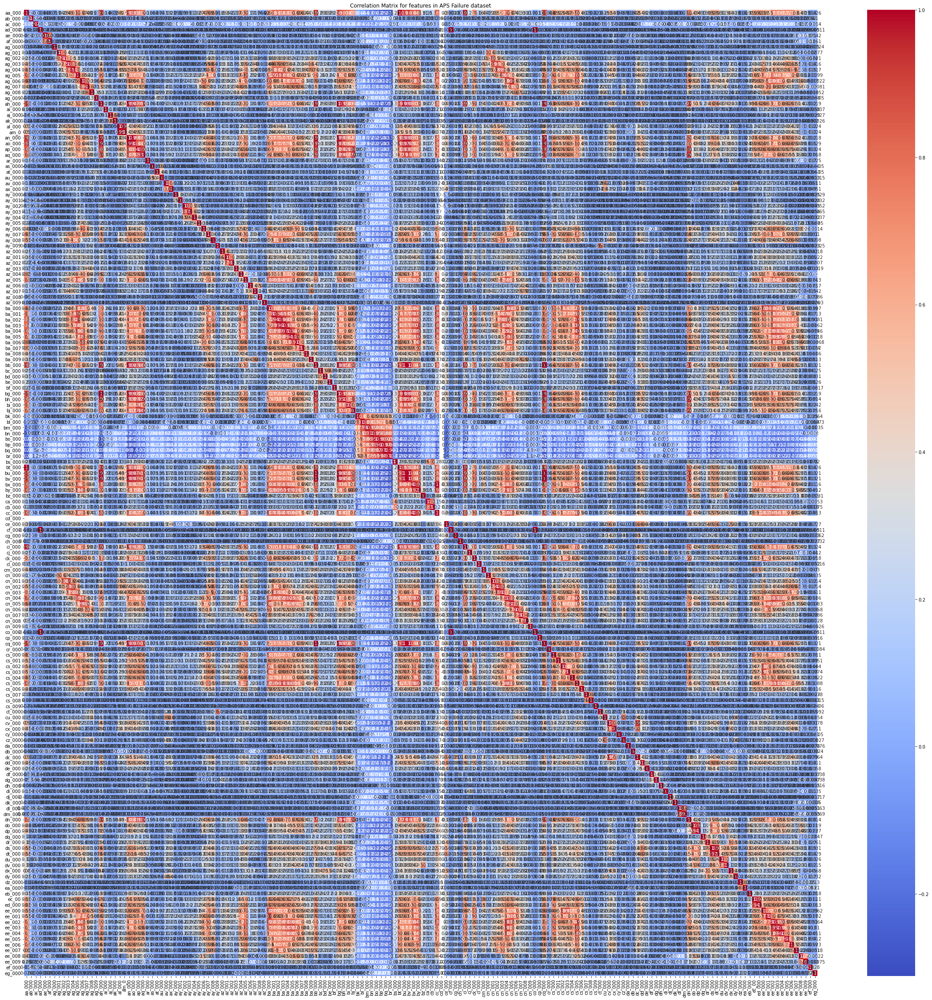

In [10]:
co_m= train_x.corr()

plt.figure(figsize=(40,40))  
sns.heatmap(co_m,annot=True,cmap="coolwarm")
plt.title("Correlation Matrix for features in APS Failure dataset")
plt.show()

#### (iv) Make scatter plots and box plots

In [11]:
n=int((170 ** 0.5)//1)
best_features= cv.sort_values(by='CV',ascending=False)
bf_df=best_features.head(n).T
bf_col=bf_df.columns.tolist()
print(f"{n} Features with highest CV are:")
bf_col

13 Features with highest CV are:


['cs_009',
 'cf_000',
 'co_000',
 'ad_000',
 'dh_000',
 'dj_000',
 'ag_000',
 'as_000',
 'ay_009',
 'ch_000',
 'az_009',
 'ak_000',
 'au_000']

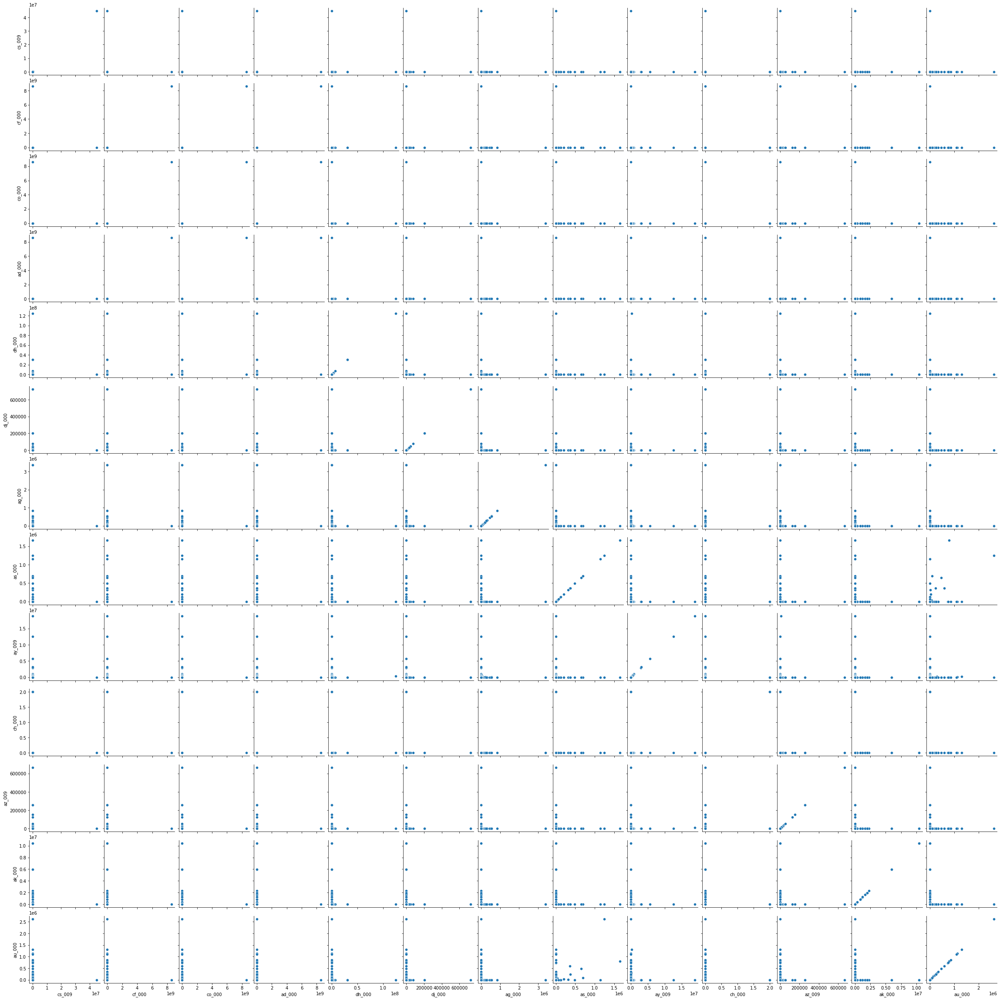

In [12]:
sns.pairplot(train_x[bf_df.columns], diag_kind=None)
plt.show()

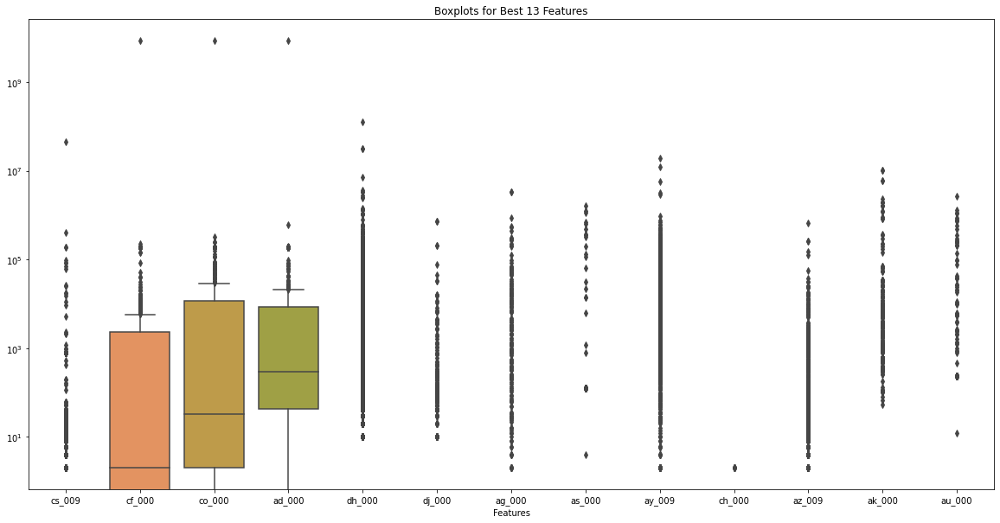

In [13]:
sc=train_x[bf_col]
plt.figure(figsize=(20,10))
boxplot=sns.boxplot(data=sc)
boxplot.set(yscale="log")
plt.xlabel("Features")
plt.title(f"Boxplots for Best {n} Features")
plt.show()

No we can not draw any conclusion or correlation from scatterplot only.

#### (v) Is this data set imbalanced?

In [14]:
def count_unique_values(dataframe, col):
    u_counts = {}

    for i in dataframe[col]:
        if i in u_counts:
            u_counts[i] += 1
        else:
            u_counts[i] = 1
    return u_counts


In [15]:
train_y

,class
0,0
1,0
2,0
3,0
4,0
...,...
59995,0
59996,0
59997,0
59998,0


In [16]:
print("For train dataset:")
count_train= count_unique_values(train_y,'class')
print(count_train)
print("For test dataset:")
count_test= count_unique_values(test_y,'class')
print(count_test)


For train dataset:
{0: 59000, 1: 1000}
For test dataset:
{0: 15625, 1: 375}


Here class 'pos' refers to 1, while the class 'neg' refers to 0. We can clearly see that there is class imbalanced in test and train data as there is huge difference between 'pos' class and 'neg' class.

### (c) Train a random forest

In [17]:
def calculate_random_forest(train_x, train_y, isbal=False):

    if not isbal:
        model_rf = RandomForestClassifier(oob_score=True)
        model_rf.fit(train_x, train_y)
    else:
        model_rf = RandomForestClassifier(max_depth=4, oob_score=True, class_weight= 'balanced')
        model_rf.fit(train_x, train_y)
    return model_rf

In [18]:
def calculate_cm_roc_auc(model, train_x, train_y):
    
    #Confusion matrix
    y_train_pred = model.predict(train_x)
    cm = confusion_matrix(train_y, y_train_pred)

    print("Confusion Matrix:")
    print(cm)
    
    #curves
    fpr, tpr, t= roc_curve(train_y, model.predict_proba(train_x)[:,-1])
    auc_train= roc_auc_score(train_y, model.predict(train_x))
    auc_=auc(fpr,tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr,tpr,label=f'AUC ={auc_:f}')
    plt.plot([0, 1],[0, 1], '--')

    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()
    
    print("ROC AUC SCORE:", round(auc_train,2))
    #Error
    accuracy=accuracy_score(train_y, y_train_pred)
    mc = 1 - accuracy
    print("Accuracy Score:", round(accuracy,4))
    print("Misclassification Error:", round(mc,4))

    
    return cm,mc

In [19]:
model_rf=calculate_random_forest(train_x,train_y)

For train dataset:
Confusion Matrix:
[[59000     0]
 [    0  1000]]


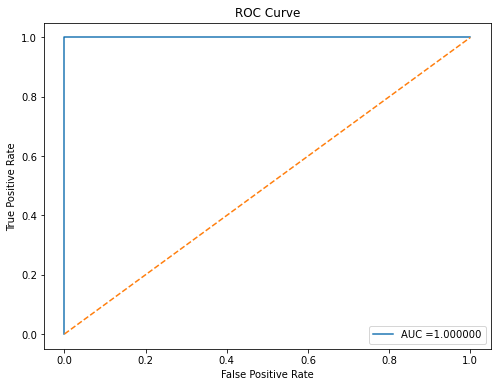

ROC AUC SCORE: 1.0
Accuracy Score: 1.0
Misclassification Error: 0.0


In [20]:
print("For train dataset:")
a,b=calculate_cm_roc_auc(model_rf, train_x, train_y)

For test dataset:
Confusion Matrix:
[[15609    16]
 [  106   269]]


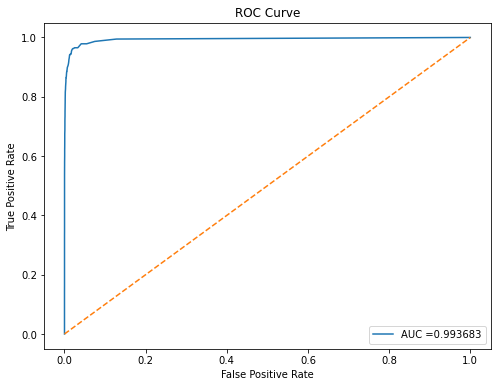

ROC AUC SCORE: 0.86
Accuracy Score: 0.9924
Misclassification Error: 0.0076


In [21]:
print("For test dataset:")
a,b=calculate_cm_roc_auc(model_rf, test_x, test_y)

In [22]:
oob_error = 1- model_rf.oob_score_
print("OOB Error for Random Forest Classifier:", round(oob_error,4))

OOB Error for Random Forest Classifier: 0.0061


### (d) Research class imbalance in random forest

1. Combining Random forest with various external class sampling techniques like resampling(oversampling in our case), SMOTE, etc.


2. Assigning weights:

    a. We can give class_weight="balanced" 

    b. class_weight="Balanced_subsample" as a parameter in the RandomForestClassifier
    
    c. Custom weighting: defining custom weights in 'class_weight'


3. Using BalancedRandomForestClassifier as classifier.


4. After already training the model, using appropriate evaluation metrics like ROC, AUC, precision etc.


In [23]:
model_rf_bal=calculate_random_forest(train_x,train_y, isbal=True)

For train dataset:
Confusion Matrix:
[[56088  2912]
 [   32   968]]


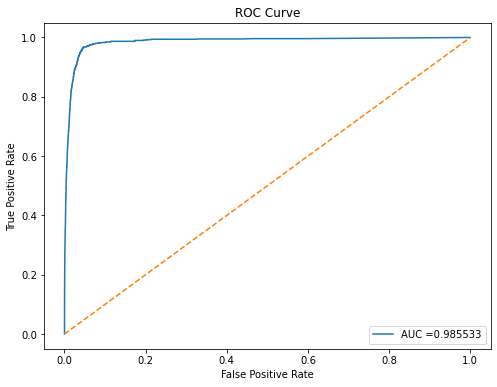

ROC AUC SCORE: 0.96
Accuracy Score: 0.9509
Misclassification Error: 0.0491


In [24]:
print("For train dataset:")
a,b=calculate_cm_roc_auc(model_rf_bal, train_x, train_y)

For test dataset:
Confusion Matrix:
[[14878   747]
 [    9   366]]


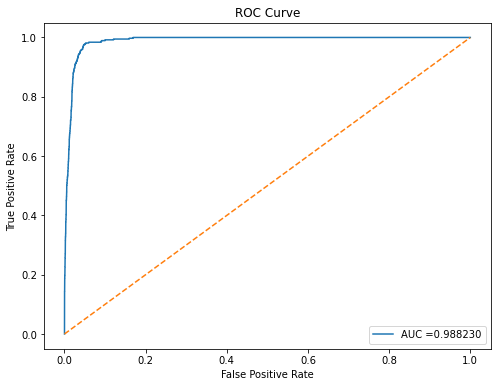

ROC AUC SCORE: 0.96
Accuracy Score: 0.9528
Misclassification Error: 0.0473


In [25]:
print("For test dataset:")
a,b=calculate_cm_roc_auc(model_rf_bal, test_x, test_y)

In [26]:
oob_error = 1- model_rf_bal.oob_score_
print("OOB Error for Random Forest Classifier:", oob_error)

OOB Error for Random Forest Classifier: 0.049449999999999994


As the datset is highly imbalanced the prediction on model without balancing the data is better and hence analysis with respect to out of Bag error, the oob error for model with imbalanced data is higher suggesting that model with imbalanced data has better performance. Accuracy calculated is also better for model with imbalanced class. Although after balancing the data model is performing better for positive class.

### (e) XGBoost and Model Trees

In [27]:
choosen_alpha= 0
bs= float('inf')
#alphas=[0.01, 0.05,0.07,0.08,0.09, 0.1, 0.2, 0.5, 0.75, 1, 2, 3, 4, 5, 10, 20, 50, 100, 200]
alphas=[0.000001,0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000,10000,100000,1000000]
for a in alphas:
    x_model= xgb.XGBRegressor(objective="binary:logistic",reg_alpha=a)
    scores= cross_val_score(x_model, train_x,train_y, cv=5, scoring='neg_mean_squared_error') 
    mean= abs(np.mean(scores))
    
    if mean < bs:
        bs= mean
        choosen_alpha= a
        
print("α (the regularization term) using cross-validation:",choosen_alpha)
accuracy=1-bs
print("Error:", bs)

model= XGBClassifier(objective="binary:logistic",reg_alpha=choosen_alpha,max_depth=5)
model.fit(train_x,train_y)

α (the regularization term) using cross-validation: 1
Error: 0.004392515899506503


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

For train dataset using XGBoost:
Confusion Matrix:
[[59000     0]
 [    4   996]]


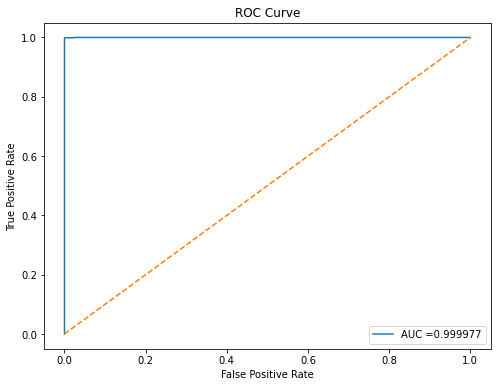

ROC AUC SCORE: 1.0
Accuracy Score: 0.9999
Misclassification Error: 0.0001


In [28]:
print("For train dataset using XGBoost:")
a,b=calculate_cm_roc_auc(model, train_x, train_y)


For test dataset using XGBoost:
Confusion Matrix:
[[15614    11]
 [   80   295]]


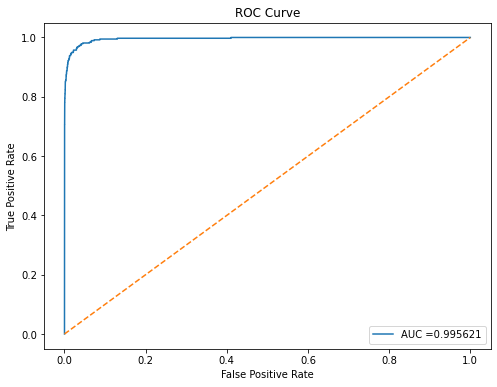

ROC AUC SCORE: 0.89
Accuracy Score: 0.9943
Misclassification Error: 0.0057


In [29]:
print("For test dataset using XGBoost:")
a,b=calculate_cm_roc_auc(model, test_x, test_y)


### (f) Use SMOTE to pre-process your data

In [30]:
#using SMOTE
smote= SMOTE()
train_x_smote,train_y_smote= smote.fit_resample(train_x, train_y)

res= count_unique_values(train_y,"class")
print("Before SMOTE:",res)
res= count_unique_values(train_y_smote,"class")
print("After SMOTE:",res)

Before SMOTE: {0: 59000, 1: 1000}
After SMOTE: {0: 59000, 1: 59000}


In [31]:
chosen_alpha = 0
bs = float('inf')
alphas = [0.01,0.1,1,10,100,1000,10000,100000,1000000]


for a in alphas:
    pipeline= Pipeline([
    ('smote', SMOTE()),  
    ('model', XGBClassifier(objective="binary:logistic", reg_alpha=a))  
    ])
   
    scores= cross_val_score(pipeline, train_x, train_y, cv=5, scoring='neg_mean_squared_error')
    mean = abs(np.mean(scores))

    if mean < bs:
        bs= mean
        chosen_alpha= a

print("α (the regularization term) using cross-validation:",chosen_alpha)
print("Error for the given α:",round(bs,4))

model1=XGBClassifier(objective="binary:logistic", reg_alpha=chosen_alpha)
model1.fit(train_x_smote,train_y_smote)


α (the regularization term) using cross-validation: 0.1
Error for the given α: 0.0064


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

For train dataset using XGBoost:
Confusion Matrix:
[[59000     0]
 [    1 58999]]


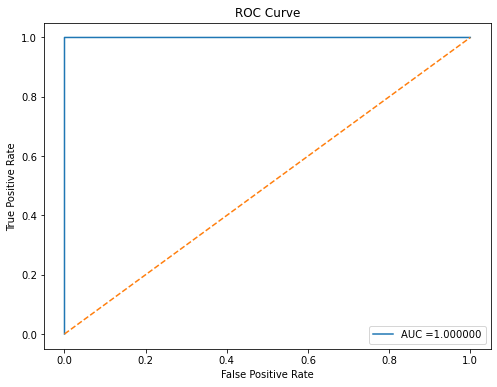

ROC AUC SCORE: 1.0
Accuracy Score: 1.0
Misclassification Error: 0.0


In [32]:
print("For train dataset using XGBoost:")
a,b=calculate_cm_roc_auc(model1, train_x_smote, train_y_smote)


For test dataset using XGBoost:
Confusion Matrix:
[[15337   288]
 [   47   328]]


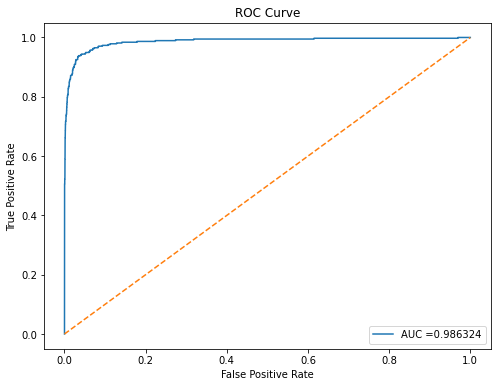

ROC AUC SCORE: 0.93
Accuracy Score: 0.9791
Misclassification Error: 0.0209


In [33]:
print("For test dataset using XGBoost:")
a,b=calculate_cm_roc_auc(model1, test_x, test_y)


We can see that misclassification error is increased after using SMOTE, hence classification is not improved. AUC score of model with using smote is also not getting better. By seeing training Confusion matrix 3 samples are being predicted correctly.

## 2. ISLR 6.6.3

3. (a) 
iv. Steadily Decrease, in Lasso, as we increase from 0 to s, the model becomes more and more flexible which means decrease in training RSS.


3.(b)
ii. Decrease initially, and then eventually start increasing in a U shape. As we increase s from 0, the models becomes more flexible, the test RSS will decrease till it overfits and then increase leading to U shape.

3.(c)
iii. Steadily increase, as s increases, the model becomes more flexible and as flexibilty is directly proportional to variance, variance will steadily increase.

3.(d)
iv. Steadily Decrease, as s increases, the model becomes more flexible and as flexibilty is inversely proportional to bias, squared bais will steadily decrease.

3.(e)
v. remains constant, irreducible error is unxplained/uncertain, that dosen't depend on the model, so irreducible error is independent of s, hence it remains constant irrespective of how s behaves.

## 3. ISLR 6.6.5

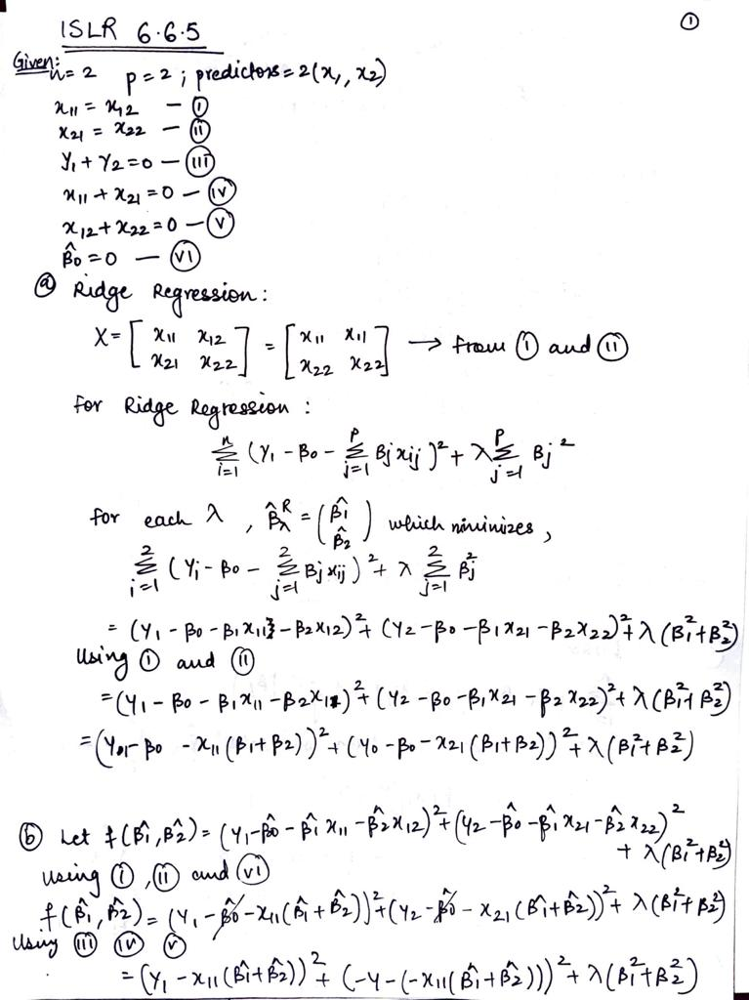

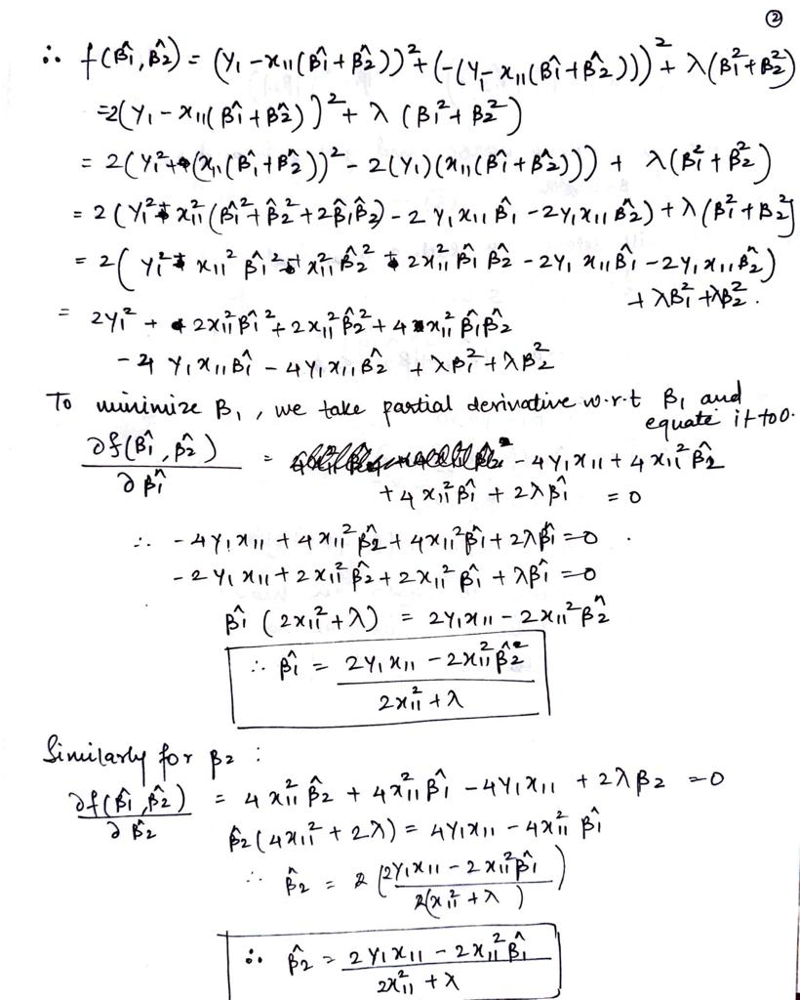

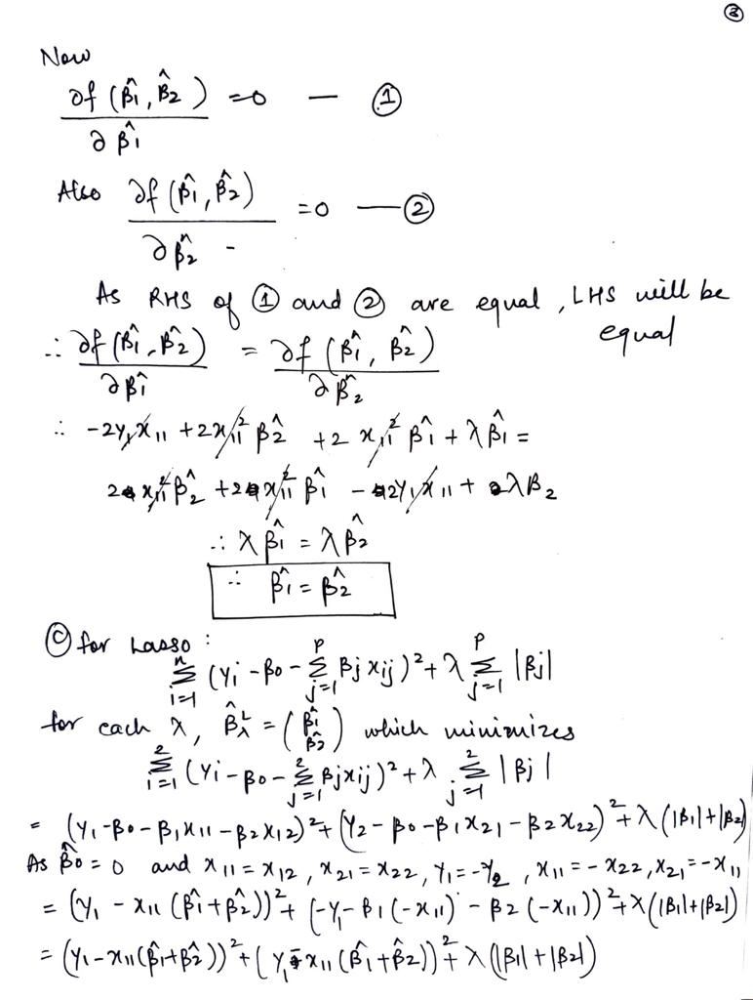

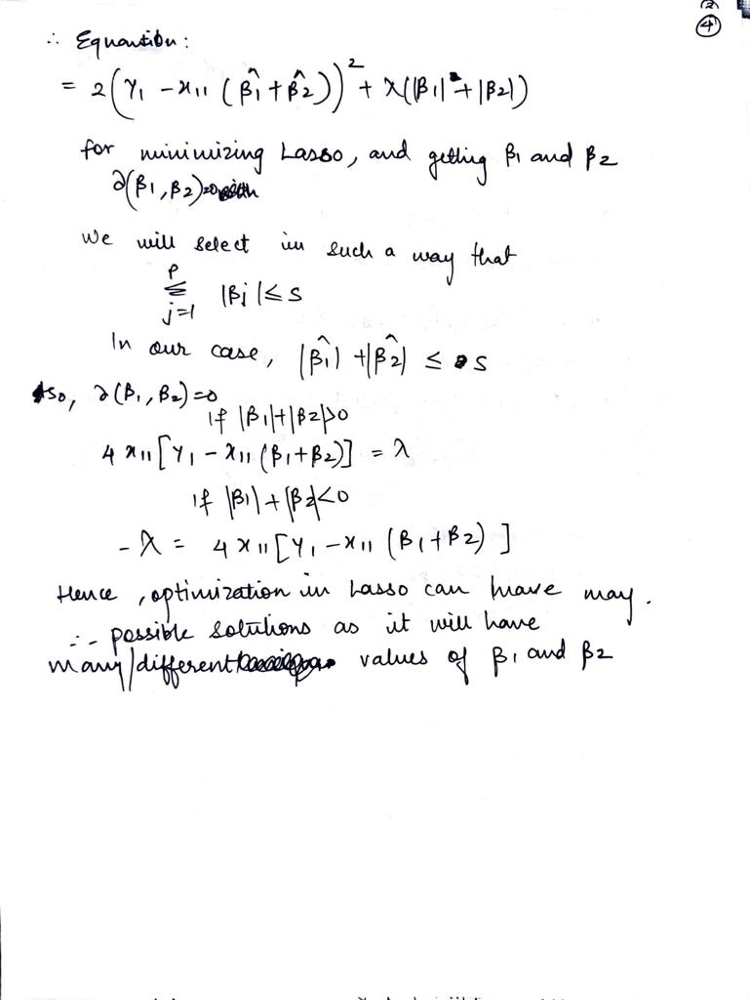

## 4. ISLR 8.4.5

By Majority polling, where probability(x)<0.5 the classification will be false other it will be true. In the above example, among 10 estimates 4 probabilities are below 0.5: (False-4), while 6 are greater that 0.5: (True-6). Hence, by majority vote approach, final predicted class will be Red.

In Average probability, the average of probabilities will be taken. Here average of all probabilities will be 0.45 and as it is less than 0.5. Hence, by average probability, final class predicted will be Green.

## 5. ISLR 9.7.3

Question:
3. Here we explore the maximal margin classifer on a toy data set.
(a) We are given n = 7 observations in p = 2 dimensions. For each
observation, there is an associated class label.
Obs. X1 X2 Y
1 3 4 Red
2 2 2 Red
3 4 4 Red
4 1 4 Red
5 2 1 Blue
6 4 3 Blue
7 4 1 Blue

Sketch the observations.

(b) Sketch the optimal separating hyperplane, and provide the equa-
tion for this hyperplane (of the form (9.1)).

(c) Describe the classifcation rule for the maximal margin classifer.
It should be something along the lines of “Classify to Red if
β0 + β1X1 + β2X2 > 0, and classify to Blue otherwise.” Provide
the values for β0, β1, and β2.

(d) On your sketch, indicate the margin for the maximal margin
hyperplane.

(e) Indicate the support vectors for the maximal margin classifer.

(f) Argue that a slight movement of the seventh observation would
not afect the maximal margin hyperplane.

(g) Sketch a hyperplane that is not the optimal separating hyper-
plane, and provide the equation for this hyperplane.

(h) Draw an additional observation on the plot so that the two
classes are no longer separable by a hyperplane.

In [34]:
df1= pd.DataFrame()
df1['X1']= [3,2,4,1,2,4,4]
df1['X2']= [4,2,4,4,1,3,1]
df1['Y']= ['red','red','red','red','blue','blue','blue']

df1

,X1,X2,Y
0,3,4,red
1,2,2,red
2,4,4,red
3,1,4,red
4,2,1,blue
5,4,3,blue
6,4,1,blue


In [35]:
df1['Y'].replace({'red': 0, 'blue': 1}, inplace = True)
train_x=df1.iloc[:, :2]
train_y=df1.iloc[:, [-1]]

<AxesSubplot:xlabel='X1', ylabel='X2'>

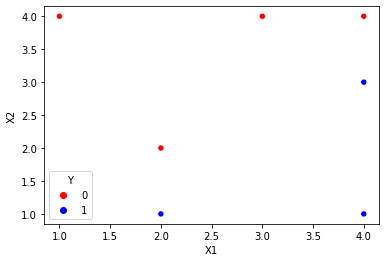

In [36]:
sns.scatterplot(data=df1, x="X1", y="X2", hue="Y", palette=['red', 'blue'])

In [37]:
model_svm= svm.SVC(kernel='linear',C=1000)
model_svm.fit(train_x, train_y)
y_pred= model_svm.predict(train_x)

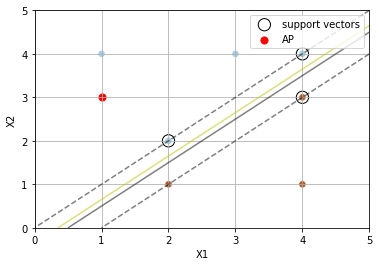

[-1.0004096] [[ 1.9998464 -1.9996928]]


In [38]:
plt.scatter(df1.iloc[:,0],df1.iloc[:,1],c=df1.iloc[:,-1],s=30,cmap=plt.cm.Paired)

xx,yy= np.meshgrid(np.linspace(df1.iloc[:,0].min()- 1,df1.iloc[:,0].max()+1,100),
                     np.linspace(df1.iloc[:,1].min()- 1, df1.iloc[:,1].max()+ 1, 100))
                            
Z= model_svm.decision_function(np.c_[xx.ravel(),yy.ravel()])
Z= Z.reshape(xx.shape)

contours= plt.contour(xx, yy, Z,levels=[-1, 0, 1], colors='k', linestyles=['--','-','--'], alpha=0.5)
contours= plt.contour(xx, yy, Z+0.3, levels= 0, colors='y',  alpha=0.5)

sv= model_svm.support_vectors_
plt.scatter(sv[:,0],sv[:,1],s=150,facecolors='none',edgecolors='k',label="support vectors")

X= df1.iloc[:,[0,1]].values  
Y= df1.iloc[:,-1].values  
                
plt.scatter(X[Y=='Red'][:,0], X[Y=='Red'][:,1], color='r')
plt.scatter(X[Y=='Blue'][:,0], X[Y=='Blue'][:,1], color='b')
plt.scatter([1],[3],color='r',s=50,label="AP")

plt.xlim(0,5)
plt.ylim(0,5)
plt.xlabel('X1')
plt.ylabel('X2')

plt.legend()
plt.grid()
plt.show()

print(model_svm.intercept_, model_svm.coef_)

(c) β0=-1, β1=2, and β2=-2, 1 - 2X1 + 2X2 < 0 classify red otherwise blue

(d) Margin for the maximal margin hyperplane is indicated by dashed line.

(e) The cirlced are the support vectors.

(f) The points near decision boundary affects the marginal maximal hyperplane. The seventh point(X1,X2)=(4,1) is not so close from maximal margin hyperplane, hence, a slight movement of seventh observation would not affect marginal maximal hyperplane.

(g) Yellow line is hyperplane that is not the optimal separating hyper- plane. It's equation is 1 + -2X1 + 2X2= Z+0.3 that is z=0.7+ -2X1 + 2X2.

(h)Point AP which belongs from red class is an additional observation on the plot so that the two classes are no longer separable by a hyperplane.